In [1]:
import argparse
import tensorflow as tf
import numpy as np
from utils.coco_dataset_manager import *
import xml.etree.ElementTree as ET
import tensorflow as tf
import keras_cv
from utils.yolo_utils import *
from utils.custom_retinanet import prepare_image
from utils.nonmaxsuppression import PreBayesianNMS
from pycocotools.coco import COCO
import cv2
import numpy as np
from keras.preprocessing import image
from keras.models import load_model
from keras.preprocessing.image import load_img, img_to_array
import os

gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
        logical_gpus = tf.config.list_logical_devices('GPU')
        print(len(gpus), "Physical GPUs," , len(logical_gpus), "Logical GPUs")
    except RuntimeError as e:
        print(e)

max_iou = .2
min_confidence = .1
cls_path = "/remote_home/Thesis/Prebayesian/yolo-cls-list.txt"
#cls_path = "yolo-cls-list.txt"

#Load the class lists from text, if not specified, it gets all 80 classes
if (cls_path == ""):
    cls_list = None
else:
    with open(cls_path) as f:
        cls_list = f.readlines()
        cls_list = [cls.replace("\n", "") for cls in cls_list]
num_classes = 80 if cls_list is None else len(cls_list)


nms = PreBayesianNMS("xywh", True, confidence_threshold=min_confidence)

backbone = keras_cv.models.YOLOV8Backbone.from_preset(
    "yolo_v8_s_backbone_coco"  # We will use yolov8 small backbone with coco weights
)

model = keras_cv.models.YOLOV8Detector(
    num_classes= num_classes,
    bounding_box_format="xywh",
    backbone=backbone,
    fpn_depth=2,
    prediction_decoder=nms
)

print(model)

c:\Users\nloftus\Documents\GitHub\Prebayesian\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Using TensorFlow backend


FileNotFoundError: [Errno 2] No such file or directory: '/remote_home/Thesis/Prebayesian/yolo-cls-list.txt'

In [5]:
checkpoint_path = "best_weights"

latest_checkpoint = tf.train.latest_checkpoint(checkpoint_path)
model.load_weights(latest_checkpoint).expect_partial()

In [50]:
def convert_image(img_path):
    img = load_img(img_path, target_size=(416,416))
    img_array = img_to_array(img)
    img_array /= 255.0
    img_array = np.expand_dims(img_array, axis=0)

In [ ]:
img_path = "/remote_home/Thesis/BDD_Files/test_folder/frame_0000.png"

image = convert_image(img_path)
print(image)
predictions = model.predict(image)
if len(list(predictions['boxes'])) > 1:
    print(img_path)
    print(predictions)

In [ ]:
folder = "/remote_home/Thesis/BDD_Files/test_folder"

for img_path in os.listdir(folder):
    img_path = os.path.join(folder, img_path)
    print(f"Image path: {img_path}")
    image = convert_image(img_path)
    print(image)
    predictions = model.predict(image)
    if len(list(predictions['boxes'])) > 1:
        print(img_path)
        print(predictions)

1/1 [==============================] - 1s 557ms/step
[]


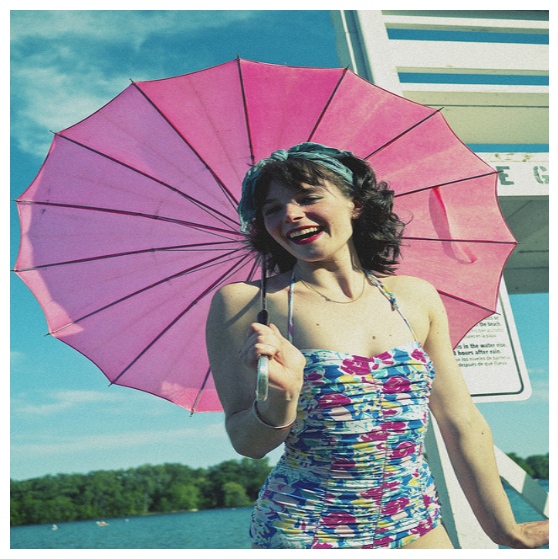

1/1 [==============================] - 1s 527ms/step
[[0.12452132 0.05834221 0.058346   0.05834221 0.05834151 0.0583416
  0.05834247 0.0583415  0.05834209 0.0583415  0.05834212 0.05834151
  0.05834772 0.05834964 0.05867506 0.05834153]
 [0.05965961 0.05965215 0.10515498 0.05965326 0.0596515  0.05965584
  0.05965079 0.05971425 0.05965066 0.05965072 0.05965069 0.05965142
  0.05965141 0.0596507  0.05965137 0.05965064]
 [0.05976687 0.05974347 0.10371791 0.05974353 0.05974657 0.0597449
  0.05974339 0.05982974 0.05974362 0.0597443  0.0597432  0.05974349
  0.05975871 0.05974332 0.05974385 0.05974311]]


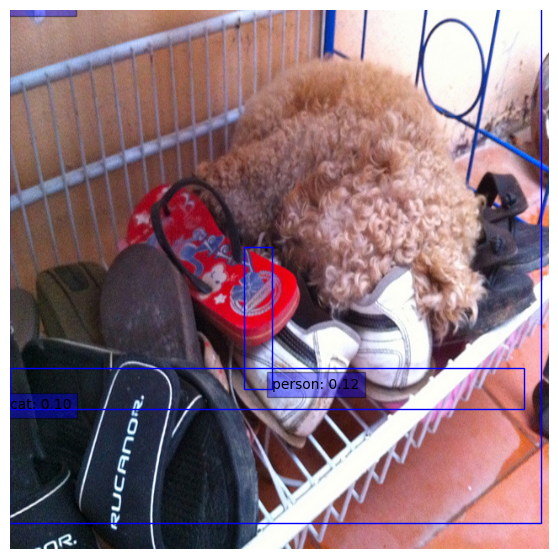

1/1 [==============================] - 0s 493ms/step
[[0.11586519 0.05895116 0.05894188 0.05893749 0.05893773 0.05893742
  0.05893887 0.05893799 0.05895815 0.05896381 0.05893753 0.0589387
  0.05893843 0.05893807 0.05893987 0.05893766]]


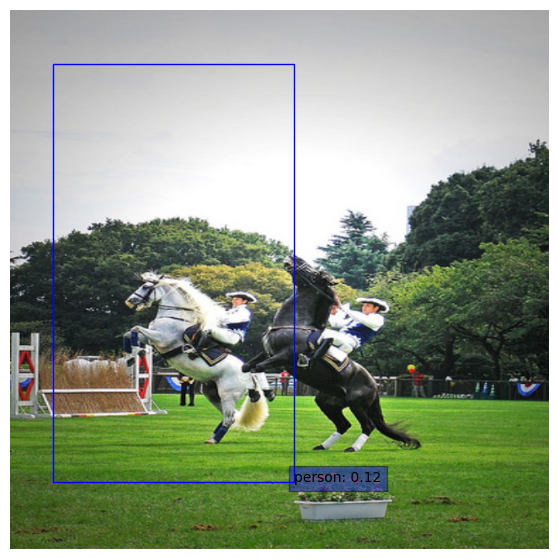

1/1 [==============================] - 1s 520ms/step
[]


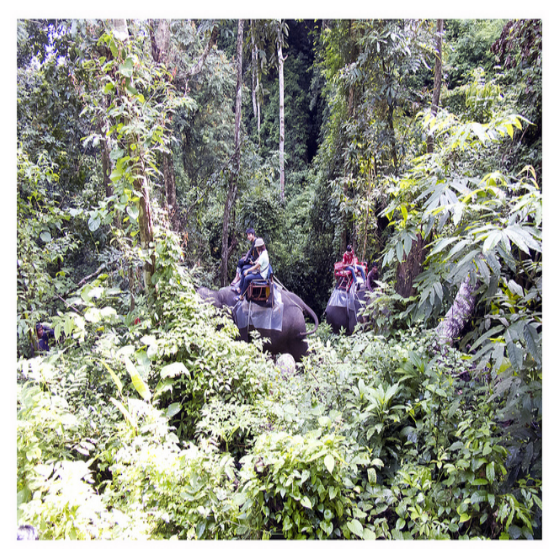

1/1 [==============================] - 1s 582ms/step
[]


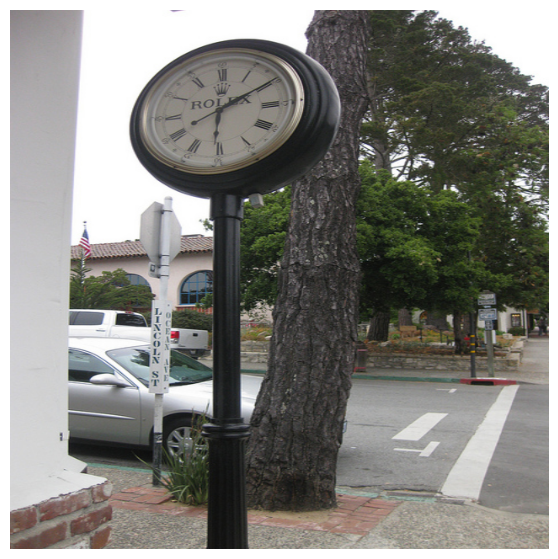

1/1 [==============================] - 1s 666ms/step
[]


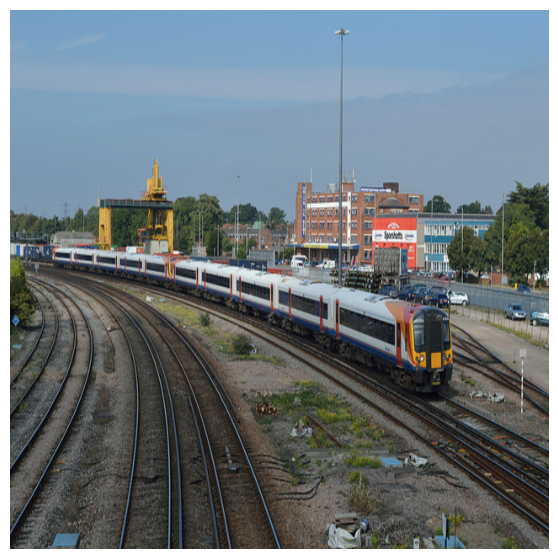

1/1 [==============================] - 1s 642ms/step
[[0.05829889 0.05829475 0.1254706  0.05830052 0.05829462 0.058305
  0.05829431 0.05838194 0.05829423 0.05829433 0.05829427 0.05829531
  0.05829765 0.05829453 0.0582948  0.05829422]]


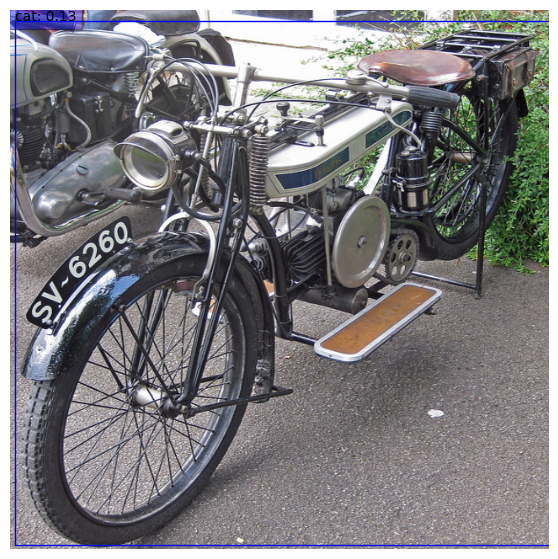

1/1 [==============================] - 1s 641ms/step
[[0.11624552 0.05892048 0.05891555 0.0589151  0.05891687 0.05891489
  0.05891505 0.05891491 0.05891501 0.05892243 0.05891484 0.05891486
  0.05891511 0.05891856 0.05892589 0.05891491]
 [0.11003335 0.05933116 0.05933106 0.05933106 0.05933108 0.05933106
  0.05933109 0.05933106 0.05933129 0.05933133 0.05933106 0.05933108
  0.05933107 0.05933106 0.05933108 0.05933108]]


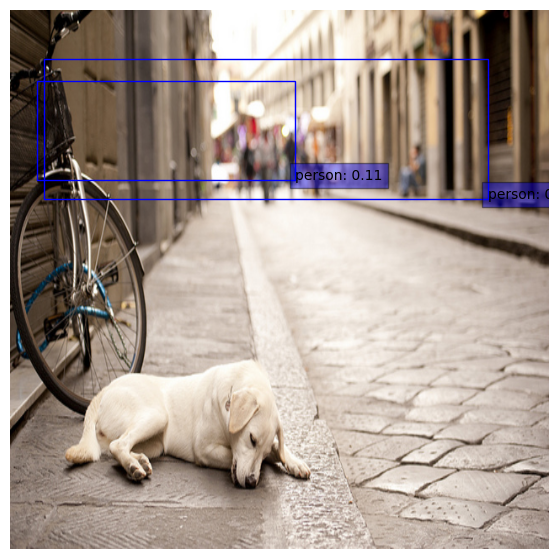

1/1 [==============================] - 1s 672ms/step
[]


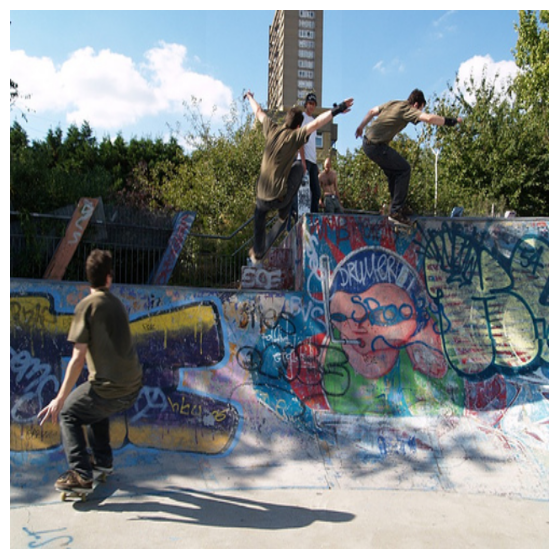

1/1 [==============================] - 1s 792ms/step
[]


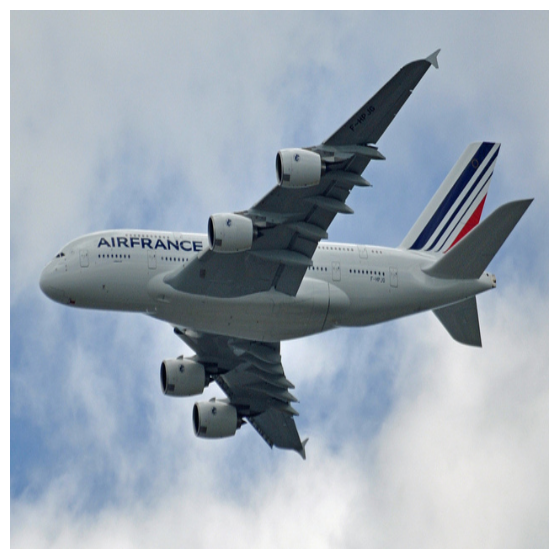

1/1 [==============================] - 1s 592ms/step
[[0.05904898 0.05904732 0.05965508 0.05905261 0.0590941  0.05911529
  0.05904769 0.11355495 0.0590459  0.05904614 0.05904574 0.05905895
  0.0590488  0.05904636 0.05904646 0.0590457 ]
 [0.05945284 0.05934958 0.05934106 0.05934067 0.05934062 0.059341
  0.05934062 0.05934516 0.05934062 0.05934058 0.05934061 0.05934105
  0.05934091 0.10960504 0.05949906 0.05934061]]


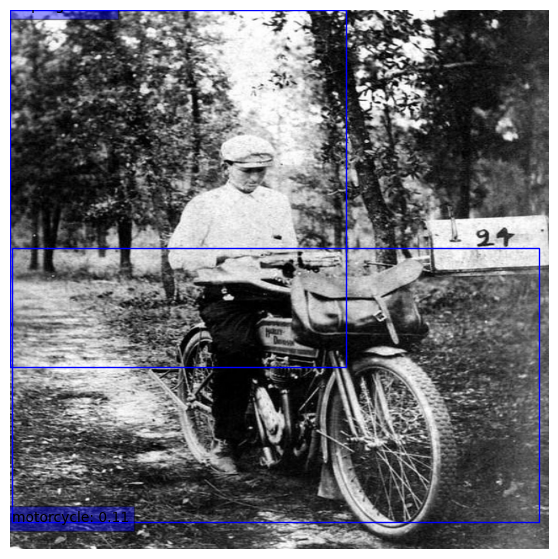

1/1 [==============================] - 1s 667ms/step
[[0.05741365 0.1388976  0.0574032  0.05740305 0.05740541 0.05741894
  0.05741729 0.05740803 0.05740522 0.05740318 0.05740649 0.05740308
  0.05740313 0.05740507 0.05740359 0.05740308]
 [0.05964632 0.05964945 0.05966928 0.05995682 0.05987343 0.0599882
  0.10342491 0.06019526 0.05965411 0.05964668 0.0596581  0.05964435
  0.05968511 0.05964386 0.06001607 0.05964803]]


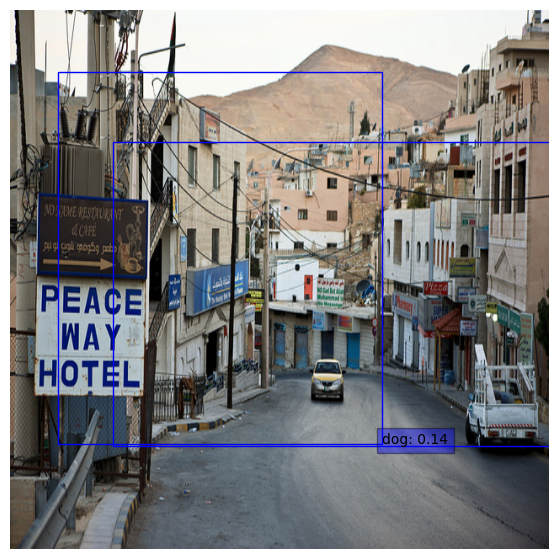

1/1 [==============================] - 1s 690ms/step
[[0.13651249 0.05756579 0.05756579 0.05756579 0.05756579 0.05756579
  0.05756579 0.05756579 0.05756637 0.05756581 0.05756579 0.05756579
  0.05756579 0.05756579 0.0575658  0.05756579]]


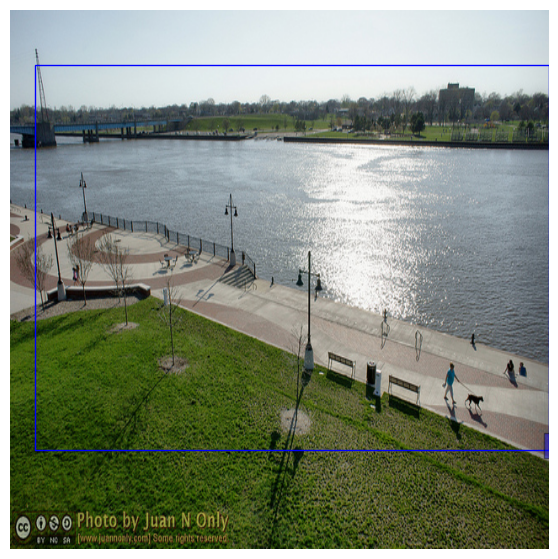

1/1 [==============================] - 1s 682ms/step
[[0.05800897 0.05800178 0.12991078 0.05800204 0.05800168 0.05800432
  0.05800172 0.05804713 0.05800166 0.05800175 0.05800167 0.05800171
  0.05800962 0.05800175 0.05800178 0.05800166]]


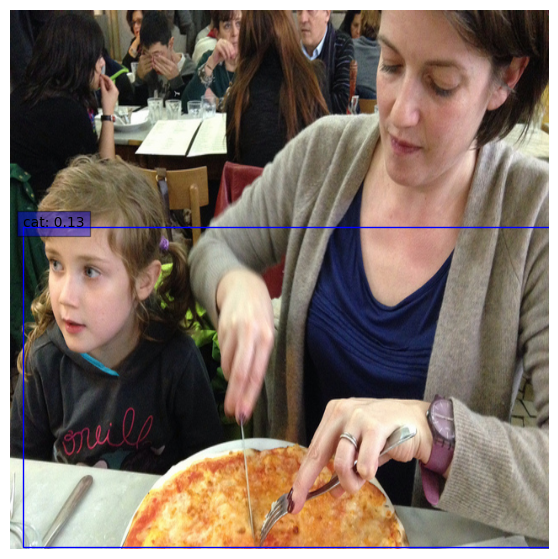

1/1 [==============================] - 1s 800ms/step
[[0.05981275 0.05862539 0.05859933 0.05859922 0.05859926 0.05860501
  0.05859954 0.05860025 0.05859924 0.05859921 0.05859929 0.05859947
  0.05859923 0.11926902 0.05909458 0.05859926]
 [0.05956816 0.06052846 0.05953221 0.05954485 0.05977016 0.10560895
  0.05954404 0.05961384 0.05953347 0.05953146 0.05953288 0.05953097
  0.0595496  0.05953621 0.05954292 0.05953182]]


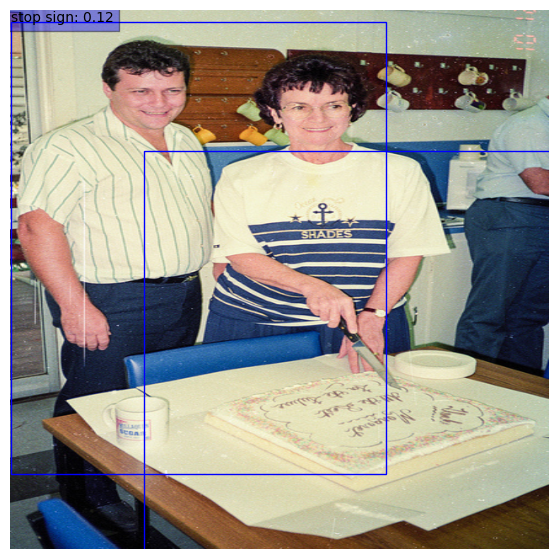

1/1 [==============================] - 1s 580ms/step
[]


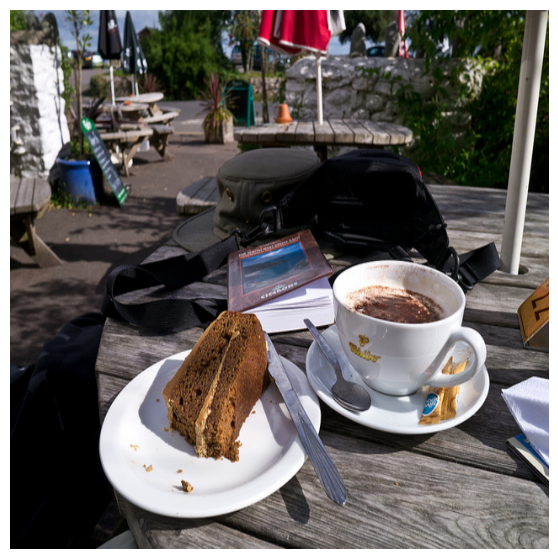

1/1 [==============================] - 1s 697ms/step
[[0.10557832 0.05962809 0.05962805 0.05962805 0.05962808 0.05962805
  0.05962806 0.05962805 0.05962838 0.0596285  0.05962805 0.05962806
  0.05962805 0.05962805 0.05962812 0.05962806]]


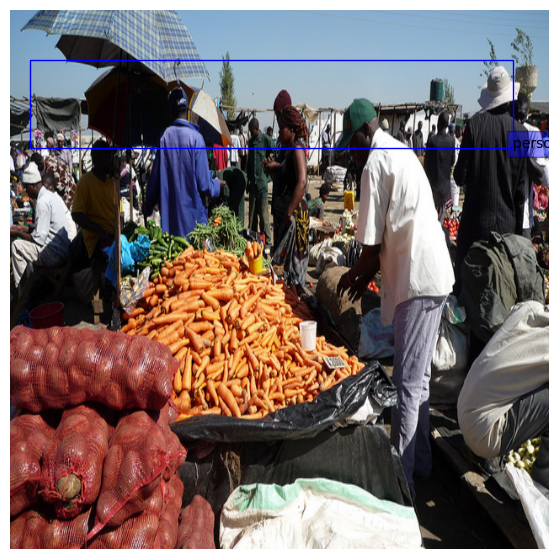

1/1 [==============================] - 1s 626ms/step
[[0.12235606 0.05850948 0.05850952 0.05850952 0.05850948 0.05850948
  0.05850948 0.05850948 0.05850948 0.05850948 0.05850948 0.05850948
  0.0585095  0.05851097 0.05850972 0.05850948]]


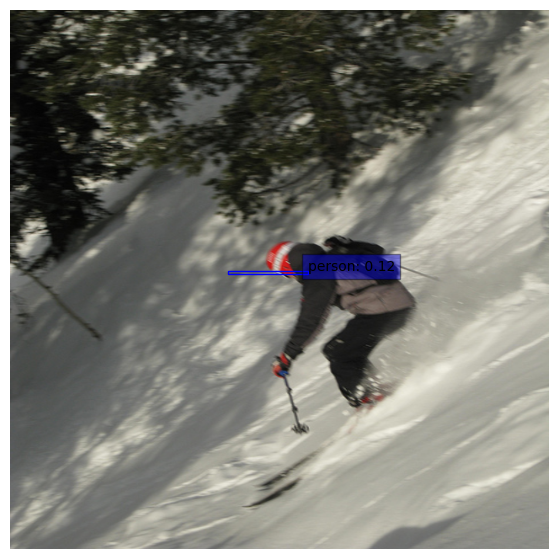

KeyboardInterrupt: 

In [6]:
images = load_images("test")

for img in images:
    try:
        image = tf.cast(img, dtype=tf.float32)

        input_image, ratio = prepare_image(image)
        detections = model.predict(input_image)

        boxes = np.asarray(detections["boxes"][0])

        cls_prob = np.asarray(detections["cls_prob"][0])

        cls_id = np.asarray(detections["cls_idx"][0])


        
        

        print(cls_prob)

        cls_name = [cls_list[x] for x in cls_id]

        
        correct_prob = []
        for i in range(len(cls_prob)):
            correct_prob.append(cls_prob[i][cls_id[i]])

        visualize_detections(image, boxes, cls_name, correct_prob)
    except IndexError:
        print("NO VALID DETECTIONS")